In [1]:
from pathlib import Path
import os
import numpy as np
import torch
import torchvision.transforms.functional as T
from matplotlib import pyplot as plt
from torchvision.utils import draw_segmentation_masks, make_grid
import pytorch_lightning as pl
import mlflow
from tqdm import tqdm
import torchmetrics
import torch.nn.functional as F
from pytorch_lightning.loggers import MLFlowLogger
from pytorch_lightning.callbacks import RichProgressBar, ModelCheckpoint

In [2]:
from inz.data.data_module import XBDDataModule
from inz.data.event import Event, Tier3, Hold,Tier1, Test
from inz.models.unet_basic import UNet
from inz.models.unet_basic_pl import OrdinalCrossEntropyLoss, SemanticSegmentor

In [3]:
RANDOM_SEED = 123
pl.seed_everything(RANDOM_SEED)
device = torch.device("cuda")
torch.set_float32_matmul_precision("high")

Seed set to 123


In [4]:
plt.rcParams["savefig.bbox"] = "tight"


def show(imgs, titles=None):
    imgs_list = [imgs] if not isinstance(imgs, list) else imgs
    titles_list = [titles] if not isinstance(titles, list) else titles
    assert len(imgs_list) == len(titles_list) or titles_list == [None], f"Got {len(imgs_list)} images and {len(titles_list)} titles"
    fig, axes = plt.subplots(ncols=len(imgs_list), squeeze=False)
    for i, img in enumerate(imgs_list):
        img = img.detach()
        img = T.to_pil_image(img)
        axes[0, i].imshow(np.asarray(img))
        axes[0, i].set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])
        if titles:
            axes[0, i].set_title(titles_list[i])

In [5]:
dm = XBDDataModule(
    path=Path("data/xBD_processed"),
    events={
        # Tier1: [
        #     Event.hurricane_florence,
        #     Event.hurricane_harvey,
        #     Event.hurricane_matthew,
        #     Event.hurricane_michael,
        # ],
        Tier3: [
            Event.joplin_tornado,
            # Event.moore_tornado,
            # Event.tuscaloosa_tornado
        ],
        # Hold: [
        #     Event.hurricane_florence,
            # Event.hurricane_harvey,
            # Event.hurricane_matthew,
        #     Event.hurricane_michael,
        # ],
        # Test: [
        #     Event.hurricane_florence,
        #     Event.hurricane_harvey,
        #     Event.hurricane_matthew,
        #     Event.hurricane_michael,
        # ],
    },
    val_faction=0.15,
    test_fraction=0.0,
    train_batch_size=32,
    val_batch_size=32,
    test_batch_size=32,
)
dm.prepare_data()
dm.setup("fit")

print(
    f"{len(dm.train_dataloader())} train batches, {len(dm.val_dataloader())} val batches, {len(dm.test_dataloader())} test batches, "
)

Split by fraction


64 train batches, 12 val batches, 0 test batches, 


In [6]:
CHECKPOINT = "models/basic_iou_epoch=291f1=0.50651iou=0.24242loss=0.03514.ckpt"
model = SemanticSegmentor.load_from_checkpoint(CHECKPOINT)
model.eval()

/home/tomek/inz/inz/.venv/lib/python3.11/site-packages/pytorch_lightning/utilities/parsing.py:199: Attribute 'model' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['model'])`.
/home/tomek/inz/inz/.venv/lib/python3.11/site-packages/pytorch_lightning/utilities/parsing.py:199: Attribute 'localization_loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['localization_loss'])`.
/home/tomek/inz/inz/.venv/lib/python3.11/site-packages/pytorch_lightning/utilities/parsing.py:199: Attribute 'classification_loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['classification_loss'])`.


SemanticSegmentor(
  (model): UNet(
    (inc): DoubleConv(
      (double_conv): Sequential(
        (0): Conv2d(3, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): SiLU(inplace=True)
        (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (5): SiLU(inplace=True)
      )
    )
    (down1): Down(
      (maxpool_conv): Sequential(
        (0): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
        (1): DoubleConv(
          (double_conv): Sequential(
            (0): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
            (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
            (3): Conv2d(

In [7]:
it = iter(dm.val_dataloader())
batch = next(it)
images_pre, masks_pre, images_post, masks_post = batch
with torch.no_grad():
    preds = model.model(images_post.to(device))

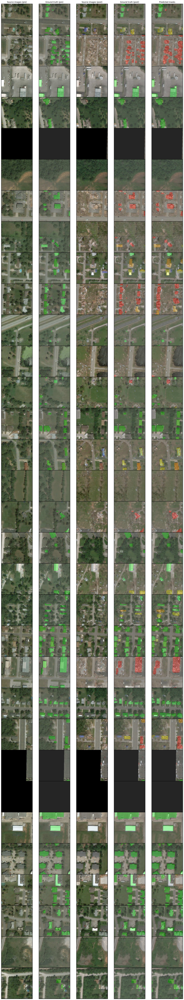

: 

In [8]:
plt.rcParams["figure.figsize"] = [20, 120]
colors = [
    (128, 128, 128),
    (0, 255, 0),
    (244, 255, 0),
    (255, 174, 0),
    (255, 0, 0),
    (255, 255, 255),
]
nrow = 1
show(
    [
        make_grid((images_pre + 1) / 2, nrow=nrow),
        make_grid(
            [draw_segmentation_masks(((i + 1) * 127.5).to(torch.uint8), m, colors=colors, alpha=0.3) for i, m in zip(images_pre, masks_pre.to(torch.bool))], nrow=nrow
        ),
        make_grid((images_post + 1) / 2, nrow=nrow),
        make_grid(
            [draw_segmentation_masks(((i + 1) * 127.5).to(torch.uint8), m, colors=colors, alpha=0.3) for i, m in zip(images_post, masks_post.to(torch.bool))], nrow=nrow
        ),
        make_grid(
            [draw_segmentation_masks(((i + 1) * 127.5).to(torch.uint8), m, colors=colors, alpha=0.3) for i, m in zip(images_post, F.one_hot(preds.argmax(dim=1)).to(torch.bool).moveaxis(-1, 1))], nrow=nrow
        ),
    ],
    titles=["Source images (pre)", "Ground truth (pre)", "Source images (post)", "Ground truth (post)", "Predicted masks"]
)